# Measured architecture

Read architecture from text file and run a simulation of the sap flux from an Arabidopsis de-topped root plunged in a hydroponic solution at a hydrostatic pressure of 0.4 Mpa when its  base is at the atmospheric pressure.

## The text format architecture file

|distance_from_base_(mm)  |lateral_root_length_(mm)  |order|
|:-:  | :-:  | :-: |
|0.89                     |90.81             	       |1|
|3.02                     |63.98             	       |1|
|102.94                   |0.0             	         |1|
|2.14                     |23.72             	       |1-1|
|90.81                    |0.0             	         |1-1|
|2.48                     |5.15             	       |1-2|
|63.98                    |0.0             	         |1-2|

This is a tab separated text file with 3 columns:

    1. the distance from base of the branching laterals in mm

    2. the lateral root length in mm

    3. a string of one or more number indicating the parent root

In the example above, the root has two lateral of 1st order and on each of them one lateral of 2d order. The order of 1 indicates that the laterals are on the primary root. The last line with order 1 with 0.0 in the second column indicates the primary root tip. The line with order 1-1 indicates that this a second order lateral on the first lateral positioned at 2.14 mm from the branching on the primary root. And so on.

A 4th column with the averaged diameter of the root may be given, that may be used to build the MTG representing the architecture.

## Running the calculation
If the package HydroRoot is not installed, the following examples can be run by cloning the sources from git and then sourcing the src directory in Ipython console for instance like this:

In [1]:
from openalea.widgets.plantgl import PlantGL # notebook viewer 3D
from openalea.plantgl.algo.view import view # 2D view
from openalea.hydroroot.display import mtg_scene
from openalea.hydroroot.read_file import read_archi_data
from openalea.hydroroot.main import hydroroot_flow, root_builder

Read the architecture file as DataFrame

In [2]:
df = read_archi_data('data/plant-01.txt')

Building the MTG from the file, and  return the primary root length, the total length and the surface. The seed refer to the seed of the root generator when the MTG is not built from a file but is generated.

In [3]:
g, primary_length, total_length, surface, seed = root_builder(df=df, segment_length=1.0e-4)

Some conductance data versus distance to tip

In [4]:
k_radial_data=([0, 0.2],[30.0,30.0])
K_axial_data=([0, 0.2],[3.0e-7,4.0e-4])

Flux and equivalent conductance calculation, for a root in an external hydroponic medium at 0.4 MPa, its base at 0.1 MPa, and with the conductances set above.

In [5]:
g, keq, jv = hydroroot_flow(g, psi_e = 0.4, psi_base = 0.1, axial_conductivity_data = K_axial_data, radial_conductivity_data = k_radial_data)

In [6]:
print('equivalent root conductance (microL/s/MPa): ',keq, 'sap flux (microL/s): ', jv)

equivalent root conductance (microL/s/MPa):  0.009596381061843703 sap flux (microL/s):  0.002878914318553111


Display the local water uptake heatmap in 3D

In [7]:
s = mtg_scene(g, prop_cmap = 'j') # create a scene from the mtg with the property j is the radial flux in ul/s
PlantGL(s) # display the root into the plantgl oawidget

Plot(antialias=3, axes=['x', 'y', 'z'], axes_helper=1.0, axes_helper_colors=[16711680, 65280, 255], background…

You may change the property to display to the hydrostatic pressure inside the xylem vessels for instance

to reduce notebook size we use here a 2D view but you can use the openalea.widgets `PlantGL(s)` to display an interactive 3D view

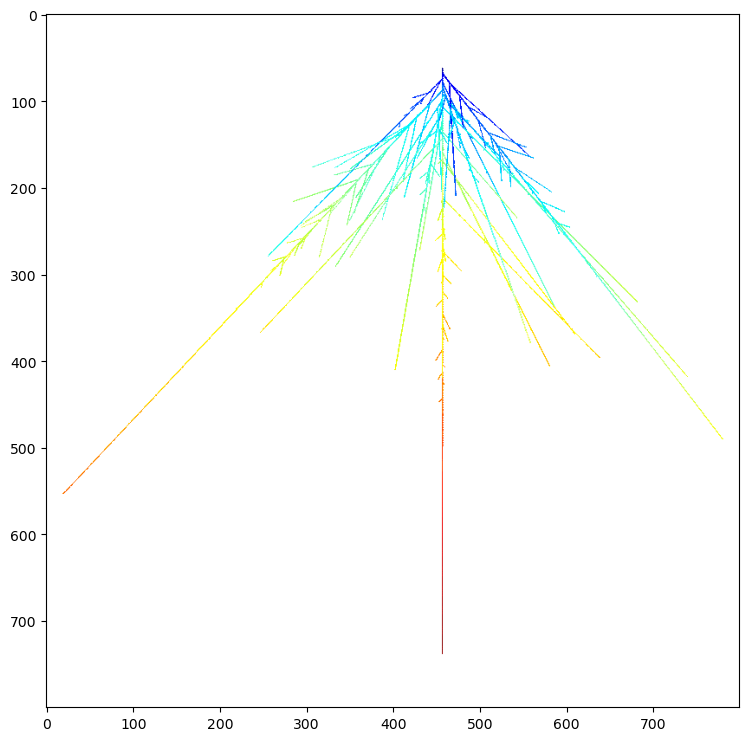

In [9]:
s = mtg_scene(g, prop_cmap='psi_in')
view(s) #PlantGL(s)

You may change the radial conductivity and see the impact on the water uptake

sap flux (microL/s):  0.010609107156851389


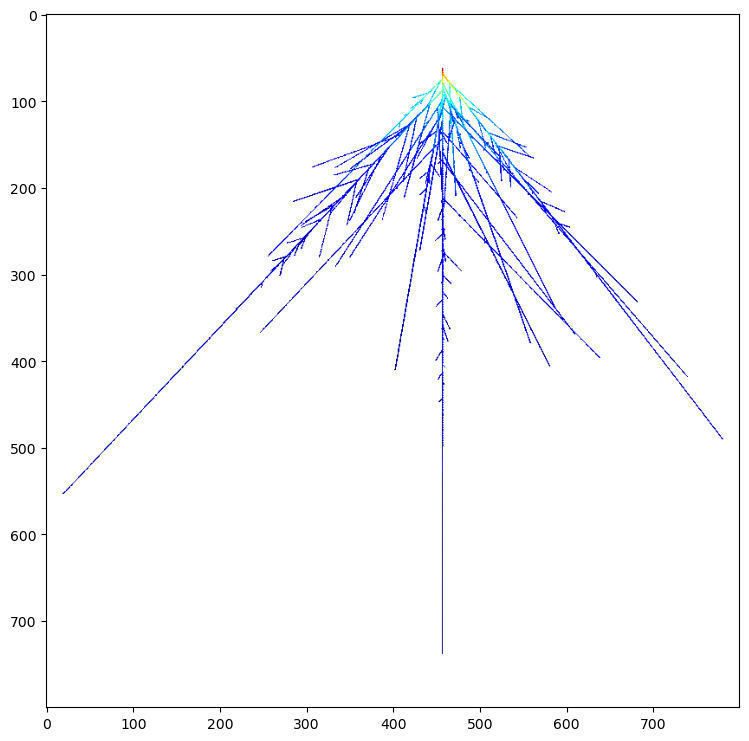

In [10]:
k_radial_data=([0, 0.2],[300.0,300.0])
g, keq, jv = hydroroot_flow(g, psi_e = 0.4, psi_base = 0.1, axial_conductivity_data = K_axial_data, radial_conductivity_data = k_radial_data)
print('sap flux (microL/s): ', jv)
s = mtg_scene(g, prop_cmap='j')
view(s) # to reduce notebook size we use here a 2D view but use PlantGL(s) to 3D

Or the axial conductance

sap flux (microL/s):  0.0019166890917623359


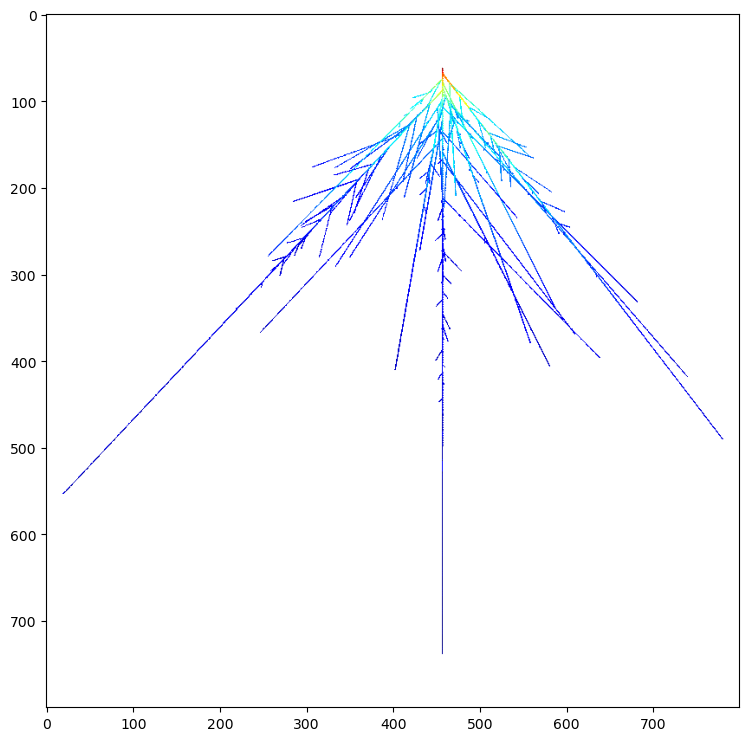

In [11]:
k_radial_data=([0, 0.2],[30.0,30.0])
K_axial_data=([0, 0.2],[3.0e-7,1.0e-4])
g, keq, jv = hydroroot_flow(g, psi_e = 0.4, psi_base = 0.1, axial_conductivity_data = K_axial_data, radial_conductivity_data = k_radial_data)
print('sap flux (microL/s): ', jv)
s = mtg_scene(g, prop_cmap='j')
view(s) # to reduce notebook size we use here a 2D view but use PlantGL(s) to 3D

## PlantGl viewer

hydroroot has also a function using the standalone plantgl viewer allowing to specify the mtg property.

The following will open a standalone window with a 3D representation of the root

In [ ]:
from openalea.hydroroot.display import plot
%gui qt
plot(g, prop_cmap='psi_in')